**• DOMAIN:** Automotive Surveillance.

**• CONTEXT:**

Computer vision can be used to automate supervision and generate action appropriate action trigger if the event is
predicted from the image of interest. For example a car moving on the road can be easily identified by a camera as make of
the car, type, colour, number plates etc.

**• DATA DESCRIPTION:**

The Cars dataset contains 16,185 images of 196 classes of cars. The data is split into 8,144 training images and 8,041 testing images, where each class has been split roughly in a 50-50 split. Classes are typically at the level of Make, Model, Year, e.g. 2012 Tesla Model S or 2012 BMW M3 coupe.

**Data description:**

‣ Train Images: Consists of real images of cars as per the make and year of the car.

‣ Test Images: Consists of real images of cars as per the make and year of the car.

‣ Train Annotation: Consists of bounding box region for training images.

‣ Test Annotation: Consists of bounding box region for testing images.

**• PROJECT OBJECTIVE:** Design a DL based car identification model.


**• DOMAIN:** Automotive Surveillance.

**• CONTEXT:**

Computer vision can be used to automate supervision and generate action appropriate action trigger if the event is
predicted from the image of interest. For example a car moving on the road can be easily identified by a camera as make of
the car, type, colour, number plates etc.

**• DATA DESCRIPTION:**

The Cars dataset contains 16,185 images of 196 classes of cars. The data is split into 8,144 training images and 8,041 testing images, where each class has been split roughly in a 50-50 split. Classes are typically at the level of Make, Model, Year, e.g. 2012 Tesla Model S or 2012 BMW M3 coupe.

**Data description:**

‣ Train Images: Consists of real images of cars as per the make and year of the car.

‣ Test Images: Consists of real images of cars as per the make and year of the car.

‣ Train Annotation: Consists of bounding box region for training images.

‣ Test Annotation: Consists of bounding box region for testing images.

**• PROJECT OBJECTIVE:** Design a DL based car identification model.


# **Step 1:**
 
 **Import the data**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import keras
from zipfile import ZipFile
import os


In [2]:
os.getcwd()

'C:\\Users\\pankaj.dev_travenues\\Downloads'

In [3]:
os.chdir('C:/Users/pankaj.dev_travenues/Downloads/')

dir = 'Capstone data'

train_annot = pd.read_csv('Capstone data/Train Annotations.csv')

test_annot = pd.read_csv('Capstone data/Test Annotation.csv')

names = pd.read_csv('Capstone data/Car names and make.csv', header = None)

In [4]:
with ZipFile("Capstone data/Car+Images.zip", 'r') as z:
    z.extractall(
        path="Capstone data/")

# Exploratory data analysis

**Distribution of images per class in train and test**

In [5]:
train_dir = 'C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Train Images/'
test_dir = 'C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Test Images/'

car_cat = []
num_classes = []

for i in os.listdir(train_dir):
    if not i.startswith('.'):
        print("No of Images in ",i," category is ",len(os.listdir(os.path.join(train_dir,i))))

No of Images in  Acura Integra Type R 2001  category is  45
No of Images in  Acura RL Sedan 2012  category is  32
No of Images in  Acura TL Sedan 2012  category is  43
No of Images in  Acura TL Type-S 2008  category is  42
No of Images in  Acura TSX Sedan 2012  category is  41
No of Images in  Acura ZDX Hatchback 2012  category is  39
No of Images in  AM General Hummer SUV 2000  category is  45
No of Images in  Aston Martin V8 Vantage Convertible 2012  category is  45
No of Images in  Aston Martin V8 Vantage Coupe 2012  category is  41
No of Images in  Aston Martin Virage Convertible 2012  category is  33
No of Images in  Aston Martin Virage Coupe 2012  category is  38
No of Images in  Audi 100 Sedan 1994  category is  41
No of Images in  Audi 100 Wagon 1994  category is  43
No of Images in  Audi A5 Coupe 2012  category is  41
No of Images in  Audi R8 Coupe 2012  category is  43
No of Images in  Audi RS 4 Convertible 2008  category is  37
No of Images in  Audi S4 Sedan 2007  category i

In [6]:
car_cat_test = []
num_classes_test = []

for i in os.listdir(test_dir):
    if not i.startswith('.'):
        print("No of Images in ",i," category is ",len(os.listdir(os.path.join(test_dir,i))))

No of Images in  Acura Integra Type R 2001  category is  44
No of Images in  Acura RL Sedan 2012  category is  32
No of Images in  Acura TL Sedan 2012  category is  43
No of Images in  Acura TL Type-S 2008  category is  42
No of Images in  Acura TSX Sedan 2012  category is  40
No of Images in  Acura ZDX Hatchback 2012  category is  39
No of Images in  AM General Hummer SUV 2000  category is  44
No of Images in  Aston Martin V8 Vantage Convertible 2012  category is  45
No of Images in  Aston Martin V8 Vantage Coupe 2012  category is  41
No of Images in  Aston Martin Virage Convertible 2012  category is  33
No of Images in  Aston Martin Virage Coupe 2012  category is  38
No of Images in  Audi 100 Sedan 1994  category is  40
No of Images in  Audi 100 Wagon 1994  category is  42
No of Images in  Audi A5 Coupe 2012  category is  41
No of Images in  Audi R8 Coupe 2012  category is  43
No of Images in  Audi RS 4 Convertible 2008  category is  36
No of Images in  Audi S4 Sedan 2007  category i

***********************************************

**There seems to be minor variation in counts however almost all categories are around same length and we do not have imbalanced data problem**

***********************************************

**Plotting few image samples**

uint8
(768, 1024, 3)


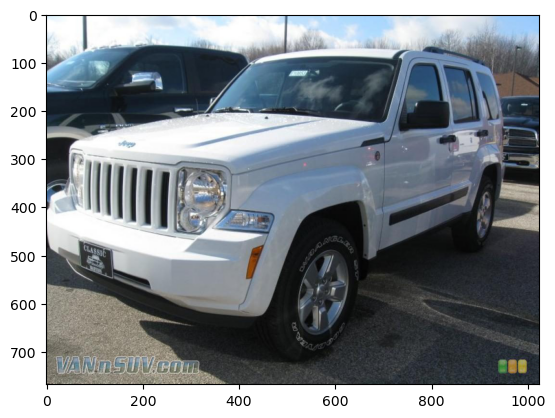

In [7]:
from matplotlib import image

train_sample = image.imread('C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Train Images/Jeep Liberty SUV 2012/03806.jpg')

print(train_sample.dtype)
print(train_sample.shape)

plt.imshow(train_sample)
plt.show()

uint8
(240, 320, 3)


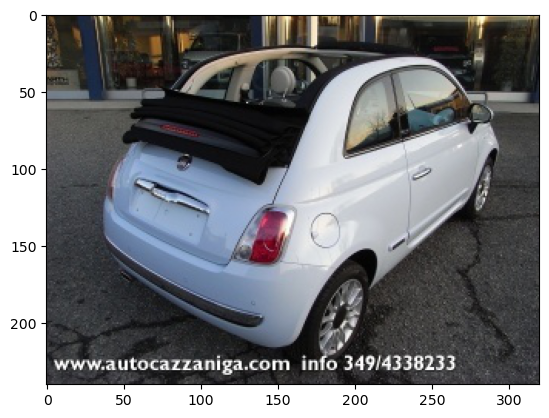

In [8]:
test_sample = image.imread('C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Test Images/FIAT 500 Convertible 2012/02582.jpg')

print(test_sample.dtype)
print(test_sample.shape)

plt.imshow(test_sample)
plt.show()

In [9]:
train_annot.head()

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


In [10]:
test_annot.head()

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185


**Names for bounding boax coordinates are not correct hence changing them to standard format i.e x0, y0, x1 and y1**

In [11]:
train_annot.rename(columns={'Bounding Box coordinates': 'x0', 'Unnamed: 2': 'y0','Unnamed: 3': 'x1','Unnamed: 4': 'y1'}, inplace=True)
test_annot.rename(columns={'Bounding Box coordinates': 'x0', 'Unnamed: 2': 'y0','Unnamed: 3': 'x1','Unnamed: 4': 'y1'}, inplace=True)

In [12]:
print('Train Annot columns:', train_annot.columns)
print('Test Annot columns:', test_annot.columns)

Train Annot columns: Index(['Image Name', 'x0', 'y0', 'x1', 'y1', 'Image class'], dtype='object')
Test Annot columns: Index(['Image Name', 'x0', 'y0', 'x1', 'y1', 'Image class'], dtype='object')


In [13]:
print('Train data types:', train_annot.dtypes)
print('Test data types:', test_annot.dtypes)

Train data types: Image Name     object
x0              int64
y0              int64
x1              int64
y1              int64
Image class     int64
dtype: object
Test data types: Image Name     object
x0              int64
y0              int64
x1              int64
y1              int64
Image class     int64
dtype: object


In [14]:
print(train_annot.isnull().sum())
print(test_annot.isnull().sum())

Image Name     0
x0             0
y0             0
x1             0
y1             0
Image class    0
dtype: int64
Image Name     0
x0             0
y0             0
x1             0
y1             0
Image class    0
dtype: int64


**Names data**

In [15]:
names.head()

,0
0,AM General Hummer SUV 2000
1,Acura RL Sedan 2012
2,Acura TL Sedan 2012
3,Acura TL Type-S 2008
4,Acura TSX Sedan 2012


In [16]:
names.rename(columns = {0 : "Car name"}, inplace = True)

In [17]:
names.head()

,Car name
0,AM General Hummer SUV 2000
1,Acura RL Sedan 2012
2,Acura TL Sedan 2012
3,Acura TL Type-S 2008
4,Acura TSX Sedan 2012


In [18]:
names.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Car name  196 non-null    object
dtypes: object(1)
memory usage: 1.7+ KB


## Step 2: Map training and testing images to its classes.

**Mapping training images with class names**

In [19]:
train_data = []
for class_name in os.listdir(train_dir):
     if not class_name.startswith('.'):
        class_path = os.path.join(train_dir, class_name)
        for img_name in os.listdir(class_path):
            if img_name.endswith('.jpg'):
                img_path = os.path.join(class_path, img_name)
                train_data.append((img_path, class_name))

train_df = pd.DataFrame(np.array(train_data), columns=['image_path', 'class_name'])

In [20]:
train_df.head()

,image_path,class_name
0,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001
1,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001
2,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001
3,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001
4,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001


**Mapping Test images with class names**

In [21]:
test_data = []
for class_name in os.listdir(test_dir):
    if not class_name.startswith('.'):
        class_path = os.path.join(test_dir, class_name)
        for img_name in os.listdir(class_path):
            if img_name.endswith('.jpg'):
                img_path = os.path.join(class_path, img_name)
                test_data.append((img_path, class_name))

test_df = pd.DataFrame(np.array(test_data), columns=['image_path', 'class_name'])
test_df.head()

,image_path,class_name
0,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001
1,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001
2,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001
3,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001
4,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001


## Step 3: Map training and testing images to its annotations.

**Mapping annotations with training images**

In [22]:
train_df['Image Name'] = train_df['image_path'].apply(lambda x: x.split('\\')[-1])
train_df.head()

,image_path,class_name,Image Name
0,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00198.jpg
1,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00255.jpg
2,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00308.jpg
3,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00374.jpg
4,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00878.jpg


In [23]:
train_df_annot = pd.merge(train_df, train_annot, on='Image Name')

In [24]:
train_df_annot.drop('Image Name', axis = 1, inplace = True)
train_df_annot.head()

,image_path,class_name,x0,y0,x1,y1,Image class
0,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,91,121,574,357,6
1,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,29,78,734,396,6
2,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,16,136,775,418,6
3,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,9,184,740,499,6
4,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,101,162,882,650,6


In [25]:
train_df_annot.tail()

,image_path,class_name,x0,y0,x1,y1,Image class
8139,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,7,7,342,219,195
8140,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,61,47,500,320,195
8141,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,31,62,621,414,195
8142,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,17,12,275,183,195
8143,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,99,131,566,439,195


In [26]:
import random 


def display_random_images(df, num_images=3, figsize=(12, 8)):

    random_indices = random.sample(range(len(df)), num_images)

    fig, ax = plt.subplots(1, num_images, figsize=figsize)
    for i in range(num_images):
        file_path = df.iloc[random_indices[i]]['image_path']
        image = plt.imread(file_path)
        ax[i].imshow(image)
        ax[i].axis('off')
        print("Image file path:", file_path)
    plt.show()

**Displaying Random images from train dataframe**

Image file path: C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Train Images/Chevrolet Tahoe Hybrid SUV 2012\05176.jpg
Image file path: C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Train Images/Bentley Continental GT Coupe 2007\04924.jpg
Image file path: C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Train Images/Chevrolet Express Cargo Van 2007\06125.jpg


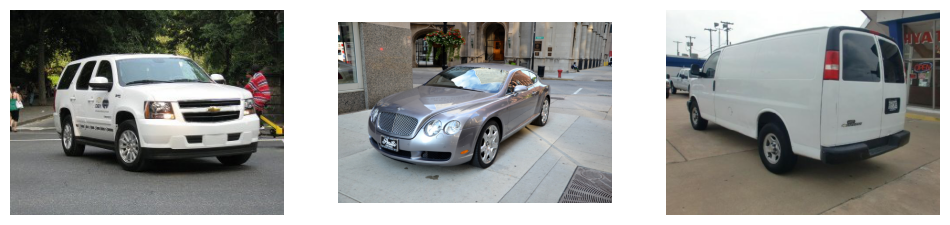

In [27]:
display_random_images(train_df_annot, num_images=3)

**Mapping annotations with test images**

In [28]:
test_df['Image Name'] = test_df['image_path'].apply(lambda x: x.split("\\")[-1])

test_df_annot = pd.merge(test_df, test_annot, on='Image Name')
test_df_annot.head()

,image_path,class_name,Image Name,x0,y0,x1,y1,Image class
0,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00128.jpg,122,149,743,455,6
1,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00130.jpg,27,74,774,449,6
2,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00386.jpg,86,184,723,425,6
3,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00565.jpg,15,1,545,347,6
4,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,00711.jpg,126,65,735,347,6


In [29]:
test_df_annot.drop('Image Name', axis = 1, inplace = True)

test_df_annot.head()

,image_path,class_name,x0,y0,x1,y1,Image class
0,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,122,149,743,455,6
1,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,27,74,774,449,6
2,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,86,184,723,425,6
3,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,15,1,545,347,6
4,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,126,65,735,347,6


In [30]:
test_df_annot.tail()

,image_path,class_name,x0,y0,x1,y1,Image class
8036,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,62,1,587,340,195
8037,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,47,63,265,180,195
8038,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,104,402,1220,817,195
8039,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,31,88,238,171,195
8040,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Volvo XC90 SUV 2007,41,87,992,661,195


**Dsiaplying Random images from test dataframe**

Image file path: C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Test Images/Chevrolet Cobalt SS 2010\07968.jpg
Image file path: C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Test Images/Ford Fiesta Sedan 2012\04262.jpg
Image file path: C:/Users/pankaj.dev_travenues/Downloads/Capstone data/Car Images/Test Images/smart fortwo Convertible 2012\00718.jpg


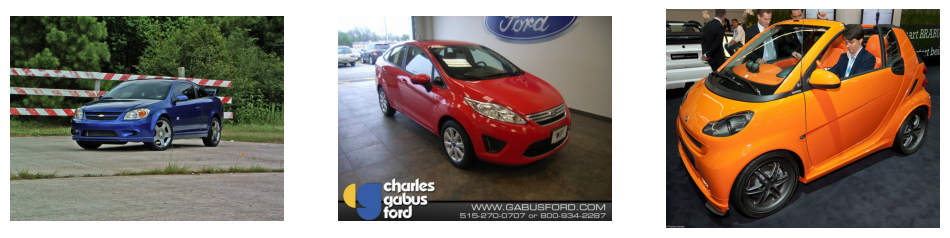

In [31]:
display_random_images(test_df_annot, num_images=3)

## Step 4: Display images with bounding box

**From train data**

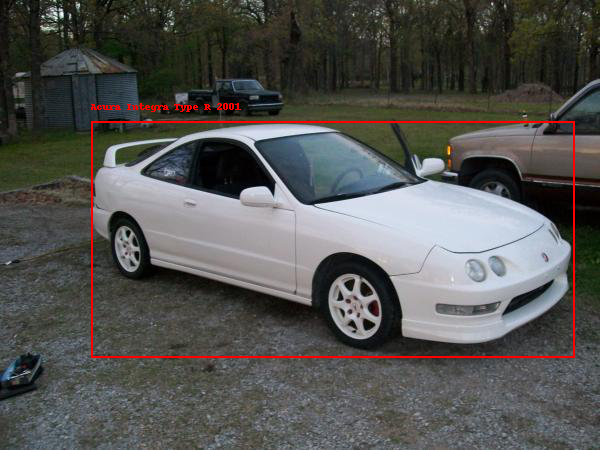

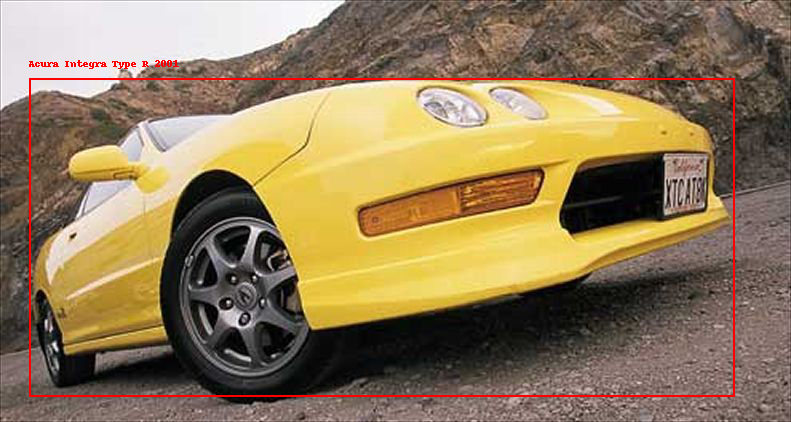

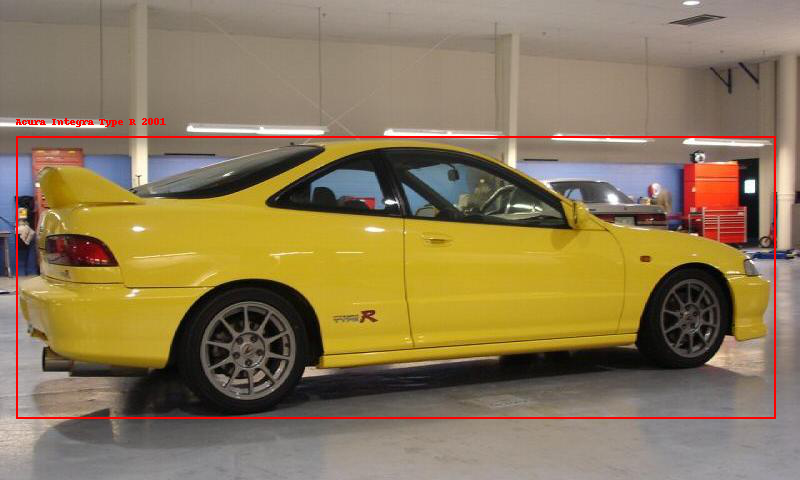

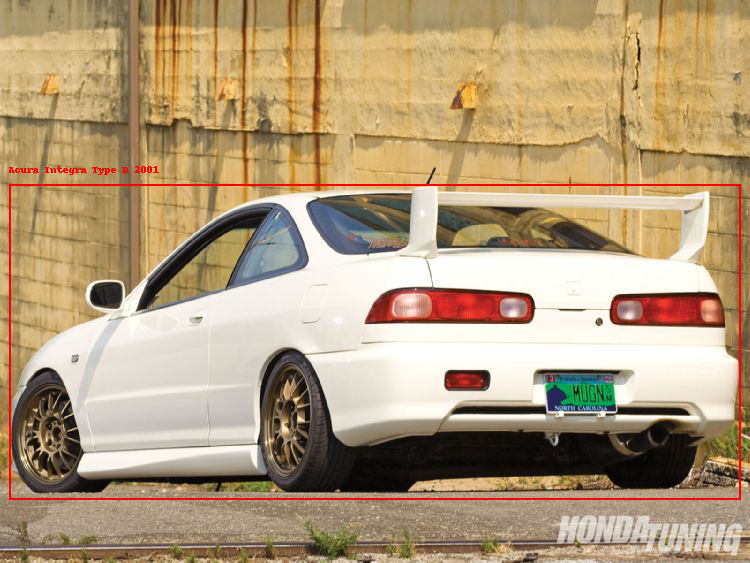

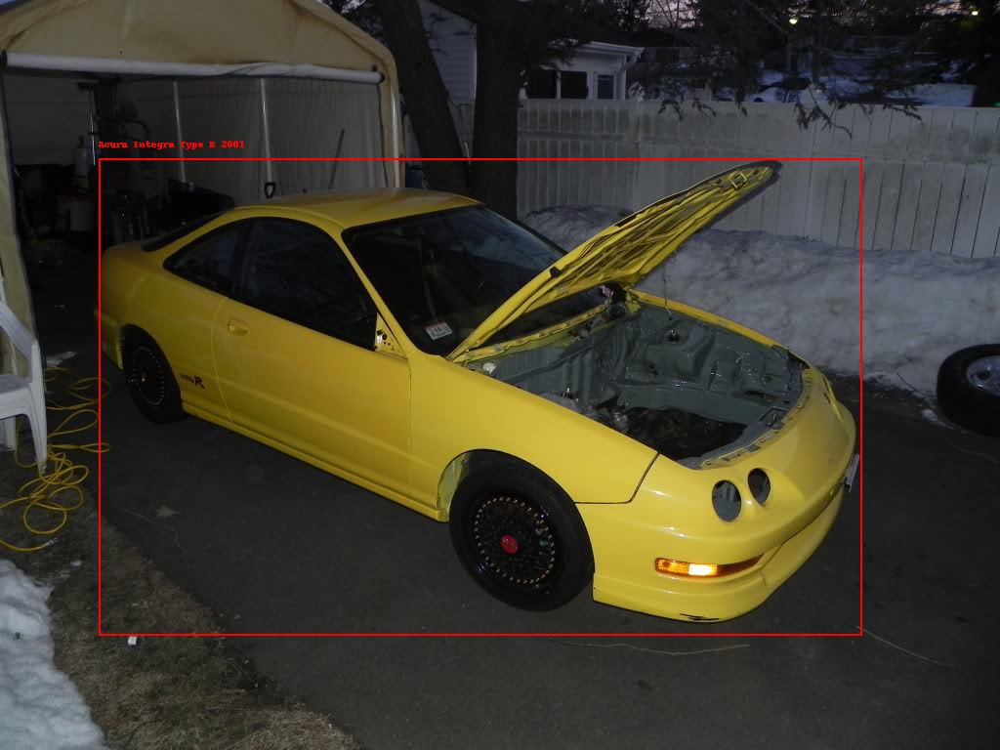

0    None
1    None
2    None
3    None
4    None
dtype: object

In [32]:
from PIL import Image, ImageDraw

def image_with_bb(image_path, class_name, x0, y0, x1, y1):
    with Image.open(image_path) as img:
        draw = ImageDraw.Draw(img)
        draw.rectangle([(x0, y0), (x1, y1)], outline='red', width=2)
        draw.text((x0, y0-20), class_name, fill='red')
        display(img)


image_subset = train_df_annot.head(5)

image_subset.apply(lambda row: image_with_bb(row['image_path'], row['class_name'], row['x0'], row['y0'], row['x1'], row['y1']), axis=1)

**From test data**

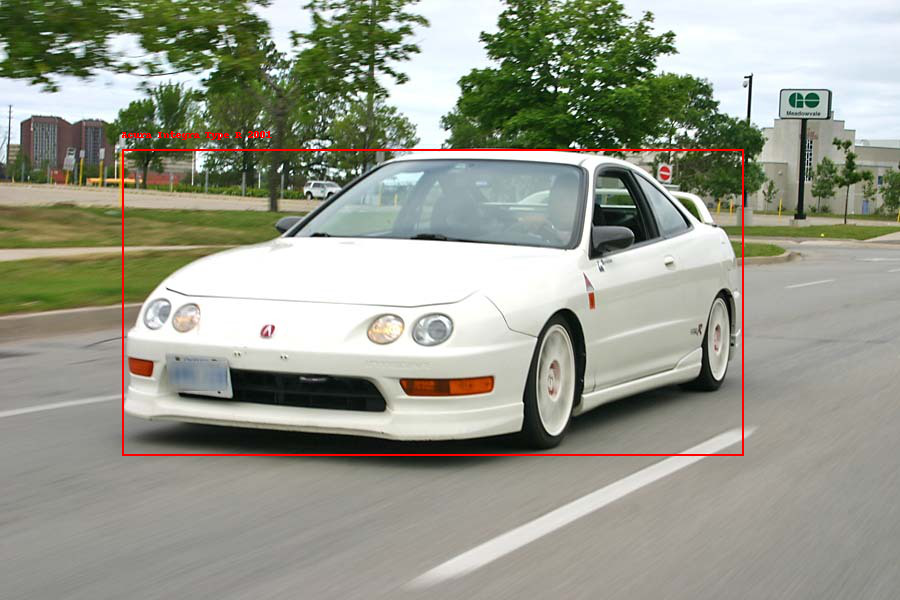

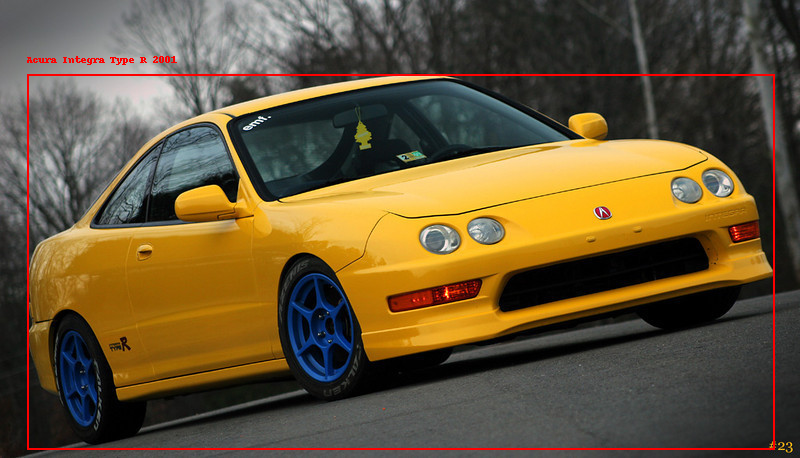

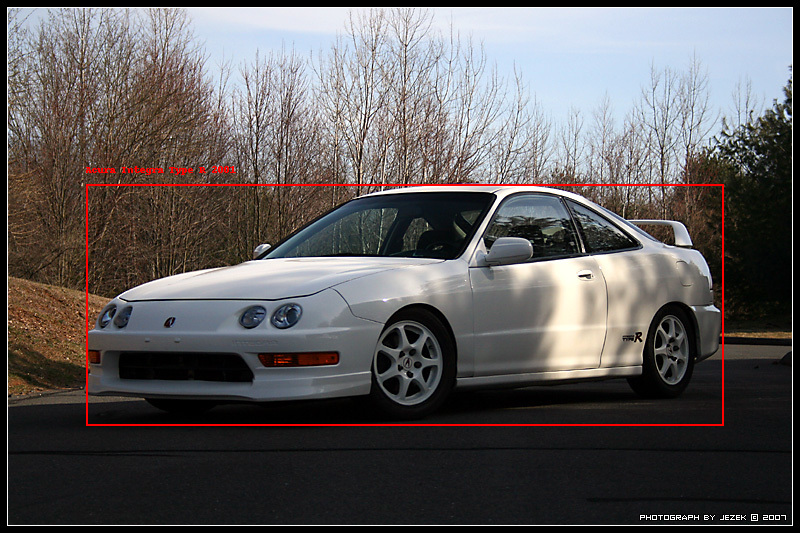

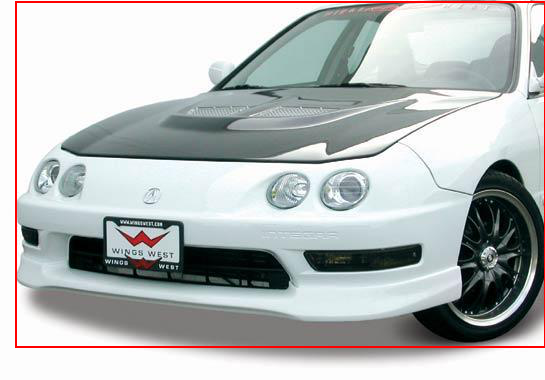

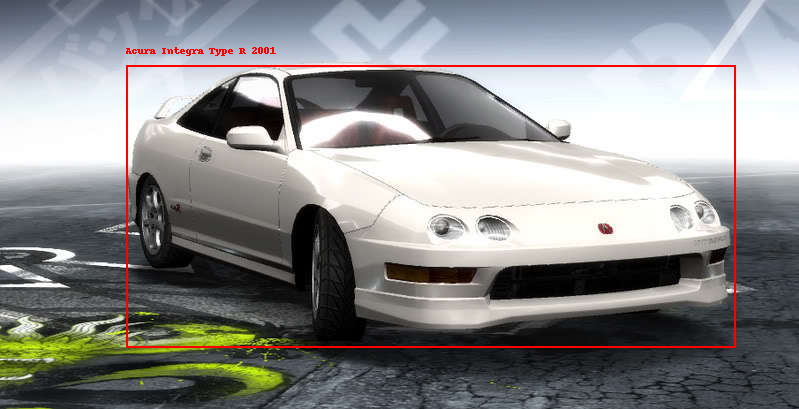

0    None
1    None
2    None
3    None
4    None
dtype: object

In [33]:
test_image_subset = test_df_annot.head(5)

test_image_subset.apply(lambda row: image_with_bb(row['image_path'], row['class_name'], row['x0'], row['y0'], row['x1'], row['y1']), axis=1)

## Step 5: Design basic CNN models to classify the car.

In [34]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense

In [35]:
# Define image dimensions and batch size
img_width, img_height = 224, 224
batch_size = 32

In [ ]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1. / 255,
    zoom_range=0.2,  
    rotation_range = 5,
    horizontal_flip=True)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1. / 255)

train_data=train_datagen.flow_from_directory(train_dir,
                                            class_mode="categorical", 
                                            target_size=(img_width, img_height), 
                                            batch_size= batch_size)

test_data=test_datagen.flow_from_directory(test_dir,
                                            class_mode="categorical", 
                                            target_size=(img_width, img_height), 
                                            batch_size= batch_size)

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


In [ ]:
device_name = tf.test.gpu_device_name()
if len(device_name) > 0:
    print("Found GPU at: {}".format(device_name))
else:
    device_name = "/device:CPU:0"
    print("No GPU, using {}.".format(device_name))

No GPU, using /device:CPU:0.


In [ ]:
with tf.device(device_name):
  model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.Dense(196, activation='softmax')])
  model.compile(optimizer= 'adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
history = model.fit(train_data,
                    steps_per_epoch=train_data.samples // batch_size + 1 ,
                    validation_data=test_data,
                    validation_steps=test_data.samples // batch_size + 1,
                    epochs=10, workers=8, max_queue_size=32, verbose=1)

Epoch 1/10
255/255 [==============================] - 53s 163ms/step - loss: 5.2845 - accuracy: 0.0060 - val_loss: 5.2769 - val_accuracy: 0.0085
Epoch 2/10
255/255 [==============================] - 49s 192ms/step - loss: 5.2788 - accuracy: 0.0081 - val_loss: 5.2759 - val_accuracy: 0.0085
Epoch 3/10
255/255 [==============================] - 49s 187ms/step - loss: 5.2758 - accuracy: 0.0079 - val_loss: 5.2722 - val_accuracy: 0.0083
Epoch 4/10
255/255 [==============================] - 49s 192ms/step - loss: 5.2511 - accuracy: 0.0112 - val_loss: 5.2427 - val_accuracy: 0.0111
Epoch 5/10
255/255 [==============================] - 48s 188ms/step - loss: 5.1742 - accuracy: 0.0165 - val_loss: 5.1947 - val_accuracy: 0.0142
Epoch 6/10
255/255 [==============================] - 49s 189ms/step - loss: 4.9881 - accuracy: 0.0334 - val_loss: 5.1492 - val_accuracy: 0.0219
Epoch 7/10
255/255 [==============================] - 49s 192ms/step - loss: 4.7452 - accuracy: 0.0538 - val_loss: 5.0788 - val_ac

In [ ]:
# Evaluating model
test_loss, test_acc = model.evaluate(test_data, verbose=2)
print('Test accuracy:', test_acc)

252/252 - 67s - loss: 5.3584 - accuracy: 0.0458 - 67s/epoch - 266ms/step
Test accuracy: 0.04576545208692551


In [ ]:
# Ploting the training and validation loss and accuracy
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(10)

Text(0.5, 1.0, 'Training and Validation Accuracy')

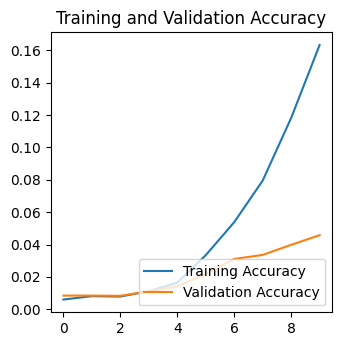

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 2, 1)
plt.plot(epochs_range, accuracy, label='Training Accuracy')
plt.plot(epochs_range, val_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

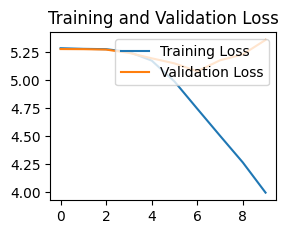

In [ ]:
plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
# Saving the model
model.save('car_classification_model.h5')

*******************************************************************

## 2.Milestone 2:

**‣Input: Preprocessed output from Milestone-1**

**‣Process: ‣Step 1: Fine tune the trained basic CNN models to classify the car**

# Basic CNN model 2 

**With kernal initializer, batch normalization, more number of nodes, layers and dropout. Also, using early stopping and Learning rate scheduler**

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stop = EarlyStopping(monitor='val_loss', patience=4, verbose=1)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1)

In [ ]:
from keras.regularizers import l2
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D

with tf.device(device_name):
  model2 = tf.keras.Sequential([
    tf.keras.layers.Conv2D(64, (3, 3), activation='relu', input_shape=(img_width, img_height, 3),kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(256, (3, 3), activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D((2, 2)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(128, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(196, activation='softmax')])
  model2.compile(optimizer= optimizer,
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [ ]:
history2 = model2.fit(train_data,
                    steps_per_epoch=train_data.samples // batch_size + 1 ,
                    validation_data=test_data,
                    validation_steps=test_data.samples // batch_size + 1,
                    epochs=20, workers=8, max_queue_size=32, verbose=1,
                    callbacks=[early_stop,scheduler])

Epoch 1/20
255/255 [==============================] - 50s 165ms/step - loss: 5.4738 - accuracy: 0.0083 - val_loss: 5.1638 - val_accuracy: 0.0141 - lr: 0.0100
Epoch 2/20
255/255 [==============================] - 49s 189ms/step - loss: 5.1530 - accuracy: 0.0161 - val_loss: 5.0922 - val_accuracy: 0.0182 - lr: 0.0100
Epoch 3/20
255/255 [==============================] - 45s 174ms/step - loss: 5.0856 - accuracy: 0.0167 - val_loss: 5.1031 - val_accuracy: 0.0206 - lr: 0.0100
Epoch 4/20
255/255 [==============================] - 49s 191ms/step - loss: 5.0087 - accuracy: 0.0214 - val_loss: 5.0241 - val_accuracy: 0.0256 - lr: 0.0100
Epoch 5/20
255/255 [==============================] - 49s 192ms/step - loss: 4.9493 - accuracy: 0.0258 - val_loss: 5.2279 - val_accuracy: 0.0205 - lr: 0.0100
Epoch 6/20
255/255 [==============================] - 49s 192ms/step - loss: 4.8685 - accuracy: 0.0312 - val_loss: 5.0342 - val_accuracy: 0.0261 - lr: 0.0100
Epoch 7/20
254/255 [============================>.] 

In [ ]:
test_loss, test_acc = model2.evaluate(test_data, verbose=2)
print('Test accuracy:', test_acc)

252/252 - 67s - loss: 4.1812 - accuracy: 0.0991 - 67s/epoch - 266ms/step
Test accuracy: 0.09911702573299408


In [ ]:
# Ploting the training and validation loss and accuracy
accuracy = history2.history['accuracy']
val_accuracy = history2.history['val_accuracy']
loss = history2.history['loss']
val_loss = history2.history['val_loss']
epochs_range = range(20)

Text(0.5, 1.0, 'Training and Validation Accuracy')

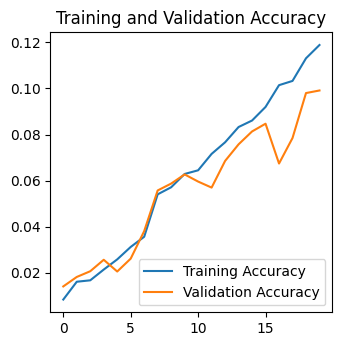

In [ ]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 2, 1)
plt.plot(epochs_range, accuracy, label='Training Accuracy')
plt.plot(epochs_range, val_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

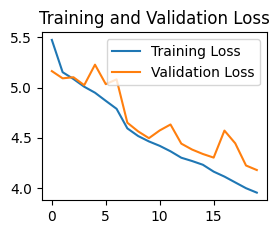

In [ ]:
plt.subplot(2, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

## Model performance is not improving. Using transfer learning architectures

# 1.) EfficientnetB1

In [ ]:
%pip install -U pip efficientnet==1.0.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 39.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 7.4 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.0.1
    Uninstalling pip-23.0.1:
      Successfully uninstalled pip-23.0.1


In [ ]:
from keras.optimizers import SGD, Adam
from keras.callbacks import ReduceLROnPlateau

early_stop = EarlyStopping(monitor='val_loss', patience=3, verbose=1)
sgd = SGD(learning_rate=0.1, momentum=0.9)
scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1)

In [ ]:
from keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization
from keras import Model, optimizers
from efficientnet.tfkeras import EfficientNetB1

base_model2 = EfficientNetB1(weights='imagenet', include_top=False)

x = base_model2.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
predictions = Dense(len(train_data.class_indices), activation='softmax')(x)
model_efc2 = Model(inputs=base_model2.input, outputs=predictions)

# fix the feature extraction part of the model
for layer in base_model2.layers:
    if isinstance(layer, BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False
        
model_efc2.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['acc'] )

27164032/27164032 [==============================] - 1s 0us/step


In [ ]:
history4 = model_efc2.fit(train_data,
                    steps_per_epoch=train_data.samples // batch_size + 1 ,
                    validation_data=test_data,
                    validation_steps=test_data.samples // batch_size + 1,
                    epochs=30,workers=8, max_queue_size=32, verbose=1,
                    callbacks=[early_stop, scheduler])

Epoch 1/30
255/255 [==============================] - 62s 200ms/step - loss: 6.4745 - acc: 0.0249 - val_loss: 4.7778 - val_acc: 0.0526 - lr: 0.1000
Epoch 2/30
255/255 [==============================] - 51s 198ms/step - loss: 4.6069 - acc: 0.0742 - val_loss: 3.7975 - val_acc: 0.1400 - lr: 0.1000
Epoch 3/30
255/255 [==============================] - 51s 197ms/step - loss: 3.9310 - acc: 0.1512 - val_loss: 3.1314 - val_acc: 0.2380 - lr: 0.1000
Epoch 4/30
255/255 [==============================] - 46s 178ms/step - loss: 3.4097 - acc: 0.2252 - val_loss: 3.1289 - val_acc: 0.2722 - lr: 0.1000
Epoch 5/30
255/255 [==============================] - 47s 182ms/step - loss: 3.0540 - acc: 0.2903 - val_loss: 2.8950 - val_acc: 0.3011 - lr: 0.1000
Epoch 6/30
255/255 [==============================] - 46s 175ms/step - loss: 2.8728 - acc: 0.3352 - val_loss: 2.6037 - val_acc: 0.3646 - lr: 0.1000
Epoch 7/30
255/255 [==============================] - 49s 187ms/step - loss: 2.6846 - acc: 0.3653 - val_loss: 2.

In [ ]:
test_loss, test_acc = model_efc2.evaluate(test_data, verbose=2)
print('Test accuracy:', test_acc)

252/252 - 67s - loss: 2.3916 - acc: 0.4853 - 67s/epoch - 266ms/step
Test accuracy: 0.48526301980018616


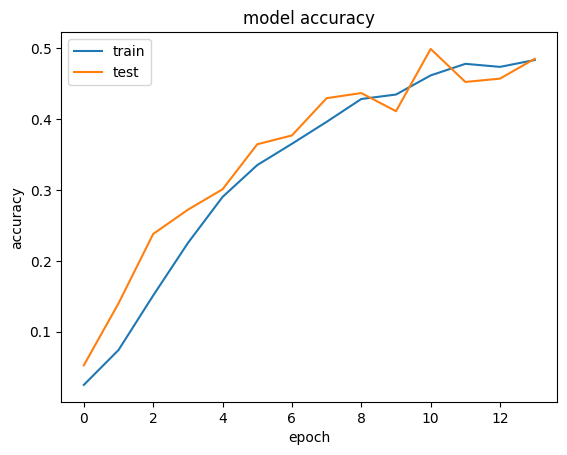

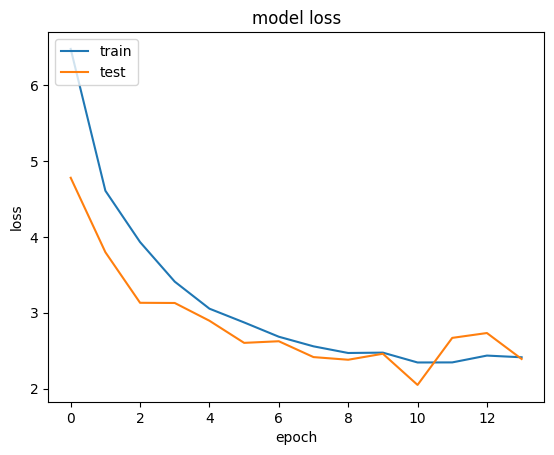

In [ ]:
plt.plot(history4.history['acc'])
plt.plot(history4.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history4.history['loss'])
plt.plot(history4.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

*************************************

**The accuracy has improved significantly and reached approx 48% but the training stopped at 14 epochs due to early stopping since val_loss wasn't improving. We would try changing the parameters on this to see it there is any improvement but trying some other architecture as well**

# 2. InceptionV3

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten

from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, GlobalAveragePooling2D, Dropout

inception_model2 = InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))


x = inception_model2.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
predictions2 = Dense(len(train_data.class_indices), activation='softmax')(x)
model_inc2 = Model(inputs=inception_model2.input, outputs=predictions2)

# fix the feature extraction part of the model
for layer in inception_model2.layers:
    if isinstance(layer, BatchNormalization):
        layer.trainable = True
    else:
        layer.trainable = False

optimizer = tf.keras.optimizers.Adam(learning_rate=0.005)
model_inc2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
history6 = model_inc2.fit(train_data,
                    steps_per_epoch=train_data.samples // batch_size + 1 ,
                    validation_data=test_data,
                    validation_steps=test_data.samples // batch_size + 1,
                    epochs=50,workers=8, max_queue_size=32, verbose=1,
                    callbacks=[early_stop,scheduler])

Epoch 1/50
255/255 [==============================] - 68s 176ms/step - loss: 5.4141 - accuracy: 0.0465 - val_loss: 4.5375 - val_accuracy: 0.0880 - lr: 0.0050
Epoch 2/50
255/255 [==============================] - 51s 196ms/step - loss: 3.9985 - accuracy: 0.1424 - val_loss: 3.4521 - val_accuracy: 0.1969 - lr: 0.0050
Epoch 3/50
255/255 [==============================] - 51s 196ms/step - loss: 3.3468 - accuracy: 0.2234 - val_loss: 2.9213 - val_accuracy: 0.2816 - lr: 0.0050
Epoch 4/50
255/255 [==============================] - 51s 196ms/step - loss: 2.9402 - accuracy: 0.2841 - val_loss: 2.5671 - val_accuracy: 0.3549 - lr: 0.0050
Epoch 5/50
255/255 [==============================] - 50s 194ms/step - loss: 2.6725 - accuracy: 0.3287 - val_loss: 2.4087 - val_accuracy: 0.3820 - lr: 0.0050
Epoch 6/50
255/255 [==============================] - 46s 177ms/step - loss: 2.4622 - accuracy: 0.3664 - val_loss: 2.1765 - val_accuracy: 0.4374 - lr: 0.0050
Epoch 7/50
255/255 [==============================] 

In [ ]:
test_loss, test_acc = model_inc2.evaluate(test_data, verbose=2)
print('Test accuracy:', test_acc)

252/252 - 67s - loss: 1.4189 - accuracy: 0.6155 - 67s/epoch - 267ms/step
Test accuracy: 0.6154707074165344


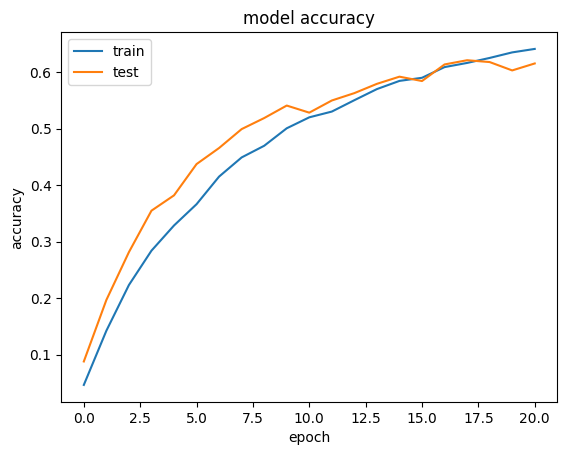

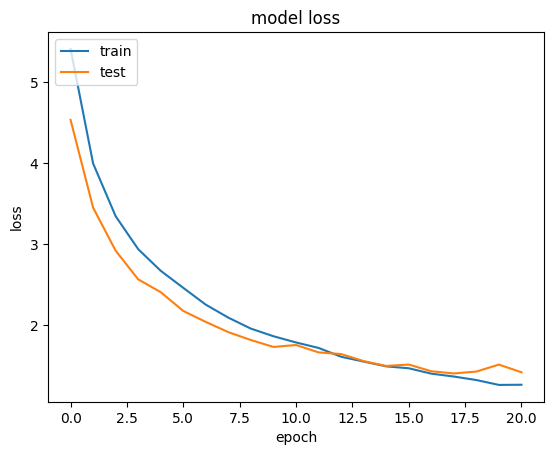

In [ ]:
plt.plot(history6.history['accuracy'])
plt.plot(history6.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history6.history['loss'])
plt.plot(history6.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

**The accuracy has improved for both train and test and now we have 61% accuracy which is far better than our initial basic CNN architecture. We can still try tweaking the hyperparameters to try for further improvement but leaving it at 61% due to computational issues since model building is taking too much time.**

*************************************************************

# Step  2:  Design,  train  and  test  RCNN  &  its  hybrids  based  object  detection  models  to  impose  the  bounding  box  or mask over the area of interest.

## RCNN Model

In [36]:
train_df_annot.head()

,image_path,class_name,x0,y0,x1,y1,Image class
0,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,91,121,574,357,6
1,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,29,78,734,396,6
2,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,16,136,775,418,6
3,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,9,184,740,499,6
4,C:/Users/pankaj.dev_travenues/Downloads/Capsto...,Acura Integra Type R 2001,101,162,882,650,6


In [37]:
train_df_annot.rename(columns = {'Image class':'image_class'}, inplace = True)
test_df_annot.rename(columns = {'Image class':'image_class'}, inplace = True)

In [ ]:
!pip install --user opencv-python-headless

  Using cached opencv_python_headless-4.7.0.72-cp37-abi3-win_amd64.whl (38.1 MB)


In [ ]:
pip install --user opencv-contrib-python

  Using cached opencv_contrib_python-4.7.0.72-cp37-abi3-win_amd64.whl (44.9 MB)
Note: you may need to restart the kernel to use updated packages.


In [38]:
import cv2

cv2.setUseOptimized(True)
ss_object = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

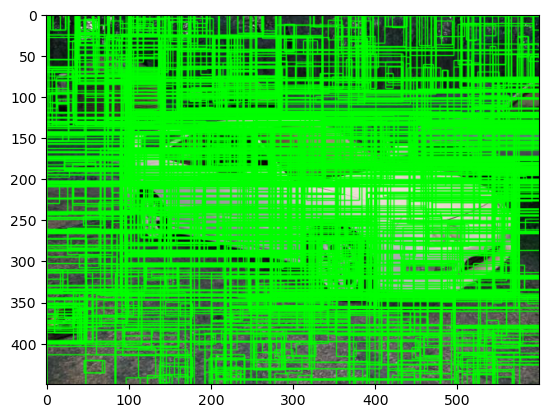

In [39]:
input_image = cv2.imread(train_df_annot.loc[0]['image_path']) #Base image for selective search
ss_object.setBaseImage(input_image)
ss_object.switchToSelectiveSearchFast()  #this method of createSelectiveSearchSegmentation()
rects = ss_object.process()    # The output of the process is a set of a potential ROI’s, depending on the size of the base image
new_input_image = input_image.copy() # create copy of the base image
for i, rect in (enumerate(rects)):
    x, y, w, h = rect
    cv2.rectangle(new_input_image, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
# plt.figure()
plt.imshow(new_input_image)

In [40]:
train_data=[]
train_labels_data=[]

**Function to Calculate IOU**

In [41]:
def calculate_iou(bb_1, bb_2):
    '''
  Now we are initialising the function to calculate IOU (Intersection Over Union) 
  of the ground truth box from the box computed by selective search.
  To divide the generated ROI’s, for example, we can use a metric called IoU. 
  It’s defined as the intersection area divided by area of the union of a predicted 
  bounding box and ground-truth box.
  '''
  
    assert bb_1['x1'] < bb_1['x2']    # The assert keyword lets you test if a condition in your code returns True, 
    assert bb_1['y1'] < bb_1['y2']    # if not, the program will raise an AssertionError.
    assert bb_2['x1'] < bb_2['x2']
    assert bb_2['y1'] < bb_2['y2']

    x_left = max(bb_1['x1'], bb_2['x1'])
    y_top = max(bb_1['y1'], bb_2['y1'])
    x_right = min(bb_1['x2'], bb_2['x2'])
    y_bottom = min(bb_1['y2'], bb_2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    intersection = (x_right - x_left) * (y_bottom - y_top)

    bb_1_area = (bb_1['x2'] - bb_1['x1']) * (bb_1['y2'] - bb_1['y1'])
    bb_2_area = (bb_2['x2'] - bb_2['x1']) * (bb_2['y2'] - bb_2['y1'])

    iou_value = intersection / float(bb_1_area + bb_2_area - intersection)
    assert iou_value >= 0.0
    assert iou_value <= 1.0
    return iou_value

**Selecting only 300 samples(300 on train data and 300 on test data) as the jupyter notebook is giving memory error on any more number than that and Colab notebooks are crashing even on Pro versions**

In [42]:
# Loop over the image folder and set each image one by one as the base for selective search using setBaseImage(image) and get the proposed regions
MAX_REGION_PROPOSALS = 2000
train_data = []
train_labels_data = []

for i in range(300):
    print(i)
    try:
        image_name = train_df_annot.loc[i, "image_path"]
        image = cv2.imread(image_name)
        x0 = train_df_annot.loc[i, "x0"]
        y0 = train_df_annot.loc[i, "y0"]
        x1 = train_df_annot.loc[i, "x1"]
        y1 = train_df_annot.loc[i, "y1"]
        coordinates=[]
        coordinates.append({"x1":x0,"x2":x1,"y1":y0,"y2":y1})
        ss_object.setBaseImage(image)
        ss_object.switchToSelectiveSearchFast()
        ss_results = ss_object.process()
        image_new = image.copy()
        min_positive_samples = 0
        min_negative_samples = 0
        flag = 0
        foreground_flag = 0
        background_flag = 0
        for region,ss_coordinate in enumerate(ss_results):
            if region < MAX_REGION_PROPOSALS and flag == 0:
                for value in coordinates:
                    x,y,w,h = ss_coordinate   
                    iou = calculate_iou(value,{"x1":x,"x2":x+w,"y1":y,"y2":y+h})
            if min_positive_samples < 30:
                if iou > 0.70:
                    mobile_obj_img = image_new[y:y+h,x:x+w]
                    resized_image = cv2.resize(mobile_obj_img, (224,224), interpolation = cv2.INTER_AREA)
                    train_data.append(resized_image)
                    train_labels_data.append(1)
                    min_positive_samples += 1
            else :
                foreground_flag = 1
            if min_negative_samples < 30:
                if iou < 0.3:
                    mobile_obj_img = image_new[y:y+h,x:x+w]
                    resized_image = cv2.resize(mobile_obj_img, (224,224), interpolation = cv2.INTER_AREA)
                    train_data.append(resized_image)
                    train_labels_data.append(0)
                    min_negative_samples += 1
            else :
                background_flag = 1
        if foreground_flag == 1 and background_flag == 1:
            print("inside")
            flag = 1
    except Exception as e:
        print(e)
        continue

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
inside
38
39
40
41
42
43
44
45
inside
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
inside
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
inside
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
inside
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
inside
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266


In [43]:
# Loop over the image folder and set each image one by one as the base for selective search using setBaseImage(image) and get the proposed regions
MAX_REGION_PROPOSALS = 2000
test_data = []
test_labels_data = []

for i in range(300):
    print(i)
    try:
        image_name = test_df_annot.loc[i, "image_path"]
        image = cv2.imread(image_name)
        x0 = test_df_annot.loc[i, "x0"]
        y0 = test_df_annot.loc[i, "y0"]
        x1 = test_df_annot.loc[i, "x1"]
        y1 = test_df_annot.loc[i, "y1"]
        coordinates=[]
        coordinates.append({"x1":x0,"x2":x1,"y1":y0,"y2":y1})
        ss_object.setBaseImage(image)
        ss_object.switchToSelectiveSearchFast()
        ss_results = ss_object.process()
        image_new = image.copy()
        min_positive_samples = 0
        min_negative_samples = 0
        flag = 0
        foreground_flag = 0
        background_flag = 0
        for region,ss_coordinate in enumerate(ss_results):
            if region < MAX_REGION_PROPOSALS and flag == 0:
                for value in coordinates:
                    x,y,w,h = ss_coordinate   
                    iou = calculate_iou(value,{"x1":x,"x2":x+w,"y1":y,"y2":y+h})
            if min_positive_samples < 30:
                if iou > 0.70:
                    mobile_obj_img = image_new[y:y+h,x:x+w]
                    resized_image = cv2.resize(mobile_obj_img, (224,224), interpolation = cv2.INTER_AREA)
                    test_data.append(resized_image)
                    test_labels_data.append(1)
                    min_positive_samples += 1
            else :
                foreground_flag = 1
            if min_negative_samples < 30:
                if iou < 0.3:
                    mobile_obj_img = image_new[y:y+h,x:x+w]
                    resized_image = cv2.resize(mobile_obj_img, (224,224), interpolation = cv2.INTER_AREA)
                    test_data.append(resized_image)
                    test_labels_data.append(0)
                    min_negative_samples += 1
            else :
                background_flag = 1
        if foreground_flag == 1 and background_flag == 1:
            print("inside")
            flag = 1
    except Exception as e:
        print(e)
        continue

0
1
2
3
4
5
6
7
8
9
inside
10
11
12
13
14
15
16
17
18
19
20
21
22
inside
23
24
inside
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
inside
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
inside
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
inside
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
inside
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
inside
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
inside
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261

**We have got the train and test data along with labels for both, preparaing it as reuqired by the model**

In [44]:
X_train = np.array(train_data)
y_train = np.array(train_labels_data)
print(X_train.shape)
print(y_train.shape)

X_test = np.array(test_data)
y_test = np.array(test_labels_data)
print(X_test.shape)
print(y_test.shape)

(11659, 224, 224, 3)
(11659,)
(11733, 224, 224, 3)
(11733,)


**LabelBinarizer for data labels**

In [45]:
from sklearn.preprocessing import LabelBinarizer

class My_Label_Binarizer(LabelBinarizer):
    def transform(self, y):
        Y = super().transform(y)
        if self.y_type_ == 'binary':
            return np.hstack((Y, 1-Y))
        else:
            return Y
    def inverse_transform(self, Y, threshold=None):
        if self.y_type_ == 'binary':
            return super().inverse_transform(Y[:, 0], threshold)
        else:
            return super().inverse_transform(Y, threshold)

mlb = My_Label_Binarizer()
y_train =  mlb.fit_transform(y_train)
y_test =  mlb.fit_transform(y_test)

In [46]:
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

(11659, 224, 224, 3) (11733, 224, 224, 3) (11659, 2) (11733, 2)


In [47]:
train_generator = ImageDataGenerator(horizontal_flip=True,
                                     vertical_flip=True, 
                                     rotation_range=90)
train_data = train_generator.flow(x=X_train, y=y_train, batch_size=8)

test_generator = ImageDataGenerator(horizontal_flip=True, 
                                    vertical_flip=True, 
                                    rotation_range=90)
test_data = test_generator.flow(x=X_test, y=y_test, batch_size=8)

In [48]:
from keras.layers import Dense, GlobalAveragePooling2D
from keras.models import Model
from keras.optimizers import Adam

# Pre-trained ResNet50 model
resnet_model = tf.keras.applications.resnet50.ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freezing the layers of the pre-trained model up to the last conv block
for layer in resnet_model.layers[:-12]:
    layer.trainable = False

# Add new trainable layers on top of the pre-trained model
x = resnet_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

model = Model(inputs=resnet_model.input, outputs=predictions)

optimizer = Adam(lr=0.0001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block3_2_conv (Conv2D)   (None, 56, 56, 64)   36928       ['conv2_block3_1_relu[0][0]']    
                                                                                                  
 conv2_block3_2_bn (BatchNormal  (None, 56, 56, 64)  256         ['conv2_block3_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_2_relu (Activatio  (None, 56, 56, 64)  0           ['conv2_block3_2_bn[0][0]']      
 n)       

C:\Users\pankaj.dev_travenues\anaconda3\lib\site-packages\keras\optimizers\legacy\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


                                                                  'conv3_block2_3_bn[0][0]']      
                                                                                                  
 conv3_block2_out (Activation)  (None, 28, 28, 512)  0           ['conv3_block2_add[0][0]']       
                                                                                                  
 conv3_block3_1_conv (Conv2D)   (None, 28, 28, 128)  65664       ['conv3_block2_out[0][0]']       
                                                                                                  
 conv3_block3_1_bn (BatchNormal  (None, 28, 28, 128)  512        ['conv3_block3_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block3_1_relu (Activatio  (None, 28, 28, 128)  0          ['conv3_block3_1_bn[0][0]']      
 n)       

                                                                                                  
 conv4_block1_add (Add)         (None, 14, 14, 1024  0           ['conv4_block1_0_bn[0][0]',      
                                )                                 'conv4_block1_3_bn[0][0]']      
                                                                                                  
 conv4_block1_out (Activation)  (None, 14, 14, 1024  0           ['conv4_block1_add[0][0]']       
                                )                                                                 
                                                                                                  
 conv4_block2_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block1_out[0][0]']       
                                                                                                  
 conv4_block2_1_bn (BatchNormal  (None, 14, 14, 256)  1024       ['conv4_block2_1_conv[0][0]']    
 ization) 

 ization)                       )                                                                 
                                                                                                  
 conv4_block4_add (Add)         (None, 14, 14, 1024  0           ['conv4_block3_out[0][0]',       
                                )                                 'conv4_block4_3_bn[0][0]']      
                                                                                                  
 conv4_block4_out (Activation)  (None, 14, 14, 1024  0           ['conv4_block4_add[0][0]']       
                                )                                                                 
                                                                                                  
 conv4_block5_1_conv (Conv2D)   (None, 14, 14, 256)  262400      ['conv4_block4_out[0][0]']       
                                                                                                  
 conv4_blo

                                                                                                  
 conv5_block1_0_bn (BatchNormal  (None, 7, 7, 2048)  8192        ['conv5_block1_0_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block1_3_bn (BatchNormal  (None, 7, 7, 2048)  8192        ['conv5_block1_3_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block1_add (Add)         (None, 7, 7, 2048)   0           ['conv5_block1_0_bn[0][0]',      
                                                                  'conv5_block1_3_bn[0][0]']      
                                                                                                  
 conv5_blo

In [49]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Create a ModelCheckpoint callback to save the best model weights during training
checkpoints = ModelCheckpoint(
    "resnet50_best_weights.h5",
    monitor='val_accuracy',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='max',)

early_stop = EarlyStopping(monitor='val_accuracy', 
                      min_delta=0, 
                      patience=100, 
                      verbose=1, 
                      mode='auto')


In [50]:
history = model.fit(train_data, steps_per_epoch= 10, epochs= 5, 
                    validation_data= test_data, validation_steps=2, 
                    callbacks=[checkpoints,early_stop])

Epoch 1/5
10/10 [==============================] - ETA: 0s - loss: 0.3236 - accuracy: 0.8375
Epoch 1: val_accuracy improved from -inf to 0.93750, saving model to resnet50_best_weights.h5
10/10 [==============================] - 16s 1s/step - loss: 0.3236 - accuracy: 0.8375 - val_loss: 0.1438 - val_accuracy: 0.9375
Epoch 2/5
10/10 [==============================] - ETA: 0s - loss: 0.1407 - accuracy: 0.9375
Epoch 2: val_accuracy improved from 0.93750 to 1.00000, saving model to resnet50_best_weights.h5
10/10 [==============================] - 10s 988ms/step - loss: 0.1407 - accuracy: 0.9375 - val_loss: 0.0670 - val_accuracy: 1.0000
Epoch 3/5
10/10 [==============================] - ETA: 0s - loss: 0.0946 - accuracy: 0.9500
Epoch 3: val_accuracy did not improve from 1.00000
10/10 [==============================] - 9s 931ms/step - loss: 0.0946 - accuracy: 0.9500 - val_loss: 0.0099 - val_accuracy: 1.0000
Epoch 4/5
10/10 [==============================] - ETA: 0s - loss: 0.1800 - accuracy: 0

Text(0.5, 1.0, 'Training and validation loss')

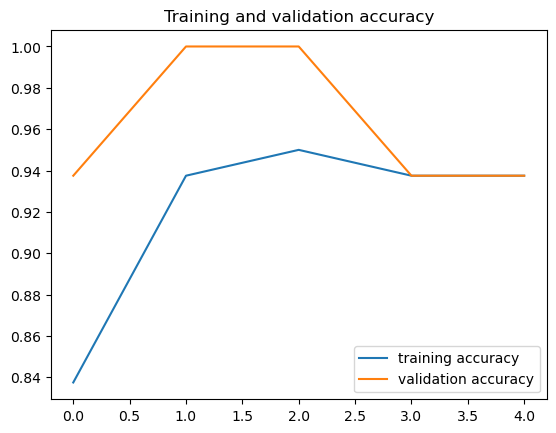

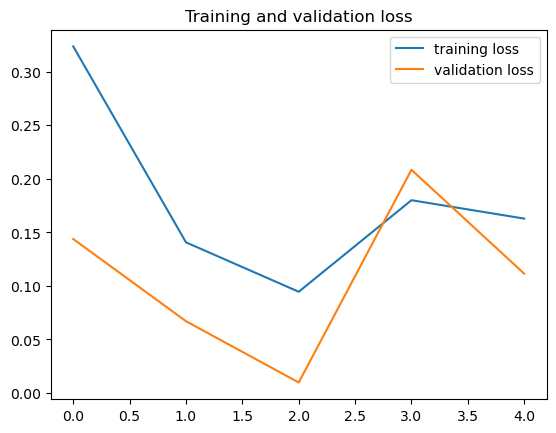

In [51]:
import matplotlib.pyplot as plt


accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss     = history.history['loss']
val_loss = history.history['val_loss']

epochs   = range(len(accuracy))

plt.plot  (epochs, accuracy, label = 'training accuracy')
plt.plot  (epochs, val_accuracy, label = 'validation accuracy')
plt.title ('Training and validation accuracy')
plt.legend(loc = 'lower right')
plt.figure()

plt.plot  (epochs, loss, label = 'training loss')
plt.plot  (epochs, val_loss, label = 'validation loss')
plt.legend(loc = 'upper right')
plt.title ('Training and validation loss')

1/1 [==============================] - 1s 1s/step
Not a car


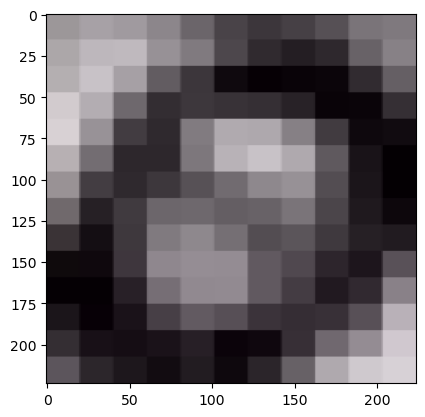

In [52]:
image_sample = X_train[50]
plt.imshow(image_sample)
image_sample = np.expand_dims(image_sample, axis=0)
result = model.predict(image_sample)
if result[0][0] > result[0][1]:
    print("Its a car")
else:
    print("Not a car")

************************************************

# Step 3: Pickle the model for future prediction

In [53]:
from tensorflow.keras.models import load_model
model.save("rcnn_resnet_model2")
model.save_weights("rcnn_weights2.h5")

INFO:tensorflow:Assets written to: rcnn_resnet_model2\assets


INFO:tensorflow:Assets written to: rcnn_resnet_model2\assets


# Prediction on saved RCNN model

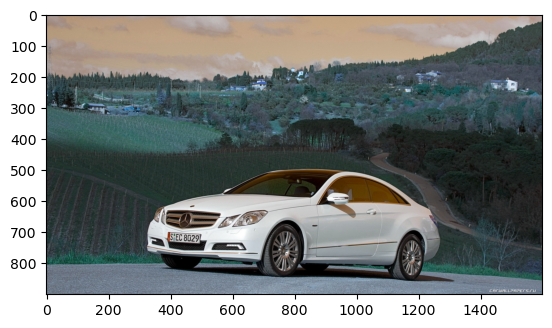

1/1 [==============================] - 1s 934ms/step
Its a car


In [55]:
from tensorflow.keras.models import load_model

loaded_model = load_model('C:/Users/pankaj.dev_travenues/Downloads/rcnn_resnet_model2')
loaded_model.load_weights("C:/Users/pankaj.dev_travenues/Downloads/rcnn_weights2.h5")

path = train_df_annot.loc[6700, "image_path"]
img = cv2.imread(path)
plt.imshow(img)
plt.show()
img = cv2.resize(img, (224, 224))
img = np.expand_dims(img, axis=0)
result = loaded_model.predict(img)
if result[0][0] > result[0][1]:
    print("Its a car")
else:
    print("It is not car")

***************************************************

# Faster RCNN model

In [ ]:
!pip install gluoncv
!pip install mxnet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 16.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 14.7 MB/s eta 0:00:00
  Attempting uninstall: graphviz
    Found existing installation: graphviz 0.20.1
    Uninstalling graphviz-0.20.1:
      Successfully uninstalled graphviz-0.20.1


In [ ]:
pip install torch==1.13.1+cu116 torchvision==0.14.1+cu116 torchaudio==0.13.1 --extra-index-url https://download.pytorch.org/whl/cu116

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/, https://download.pytorch.org/whl/cu116
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 GB 851.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.2/24.2 MB 53.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 95.2 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 2.0.0+cu118
    Uninstalling torch-2.0.0+cu118:
      Successfully uninstalled torch-2.0.0+cu118
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.15.1+cu118
    Uninstalling torchvision-0.15.1+cu118:
      Successfully uninstalled torchvision-0.15.1+cu118
  Attempting uninstall: torchaudio
    Found existing installation: torchaudio 2.0.1+cu118
    Uninstalling torchaudio-2.0.1+cu118:
      Successfully uninstalled torchaudio-2.0.1+cu118
ERROR: pip's dependency resolver does not currently take into account all th

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import mxnet as mx
import gluoncv
from gluoncv import model_zoo, data, utils
from google.colab.patches import cv2_imshow 

/usr/local/lib/python3.10/dist-packages/gluoncv/__init__.py:40: UserWarning: Both `mxnet==1.9.1` and `torch==1.13.1+cu116` are installed. You might encounter increased GPU memory footprint if both framework are used at the same time.
  warnings.warn(f'Both `mxnet=={mx.__version__}` and `torch=={torch.__version__}` are installed. '


In [ ]:
#pretrained Faster RCNN with Resnet50 as base model v3 model from model_zoo class of gluoncv
fcnn_net = model_zoo.get_model('faster_rcnn_resnet50_v1b_voc', pretrained=True)         

121888KB [00:01, 63315.29KB/s]                            


In [ ]:
def detect_and_label(rgb_frame):
    final_array = mx.nd.array(rgb_frame)
    x, img = gluoncv.data.transforms.presets.rcnn.transform_test(final_array)
    class_IDs, scores, bounding_boxes = fcnn_net(x)
    ax = utils.viz.plot_bbox(img, bounding_boxes[0], scores[0],
                             class_IDs[0], class_names=fcnn_net.classes)
    # plt.rcParams['figure.figsize'] = [80, 50]
    plt.show(block=False)         
    plt.pause(0.0001)
    plt.close()     


**Object detection from train folder images**

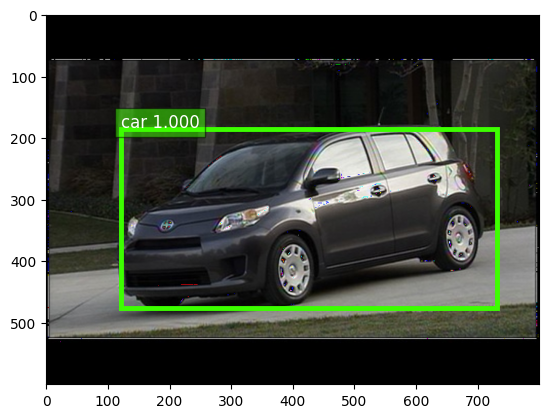

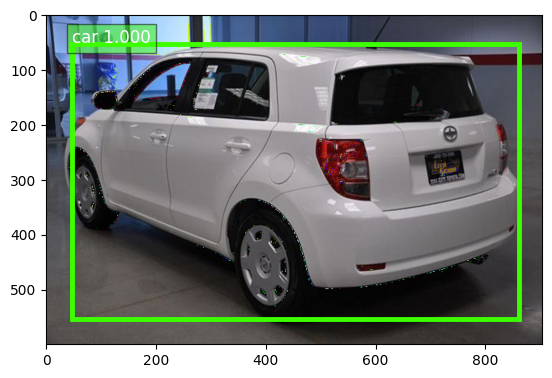

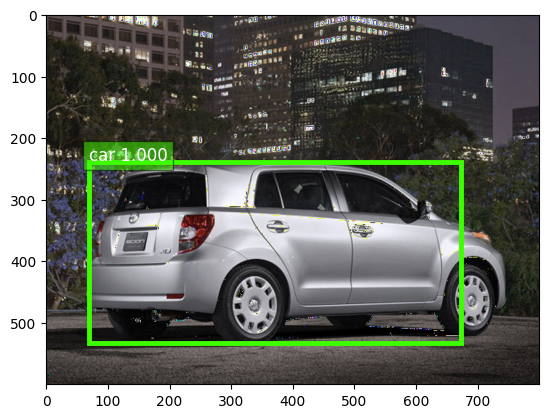

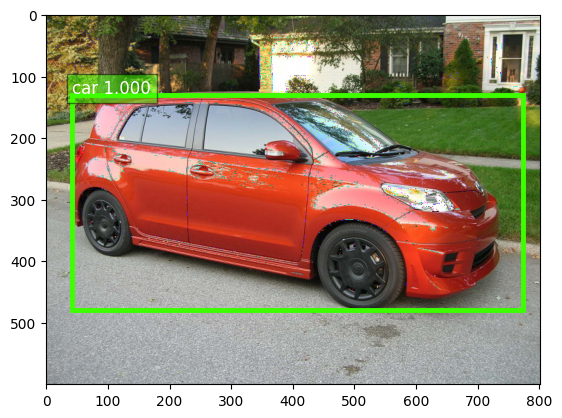

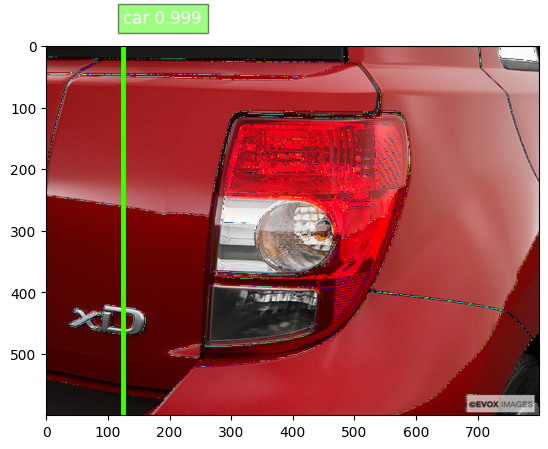

In [ ]:
def detection_trainImg():
    for i in range(5):
      image_name = train_df_annot.loc[i, "image_path"]
      image = cv2.imread(image_name)
      rgb_frame = image[:, :, ::-1]
      detect_and_label(rgb_frame)
    cv2.destroyAllWindows()       # handle interrupts

detection_trainImg()  

*****************************************************

**Object detection from test folder images**

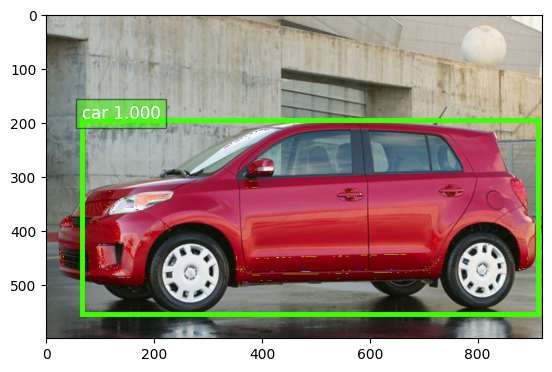

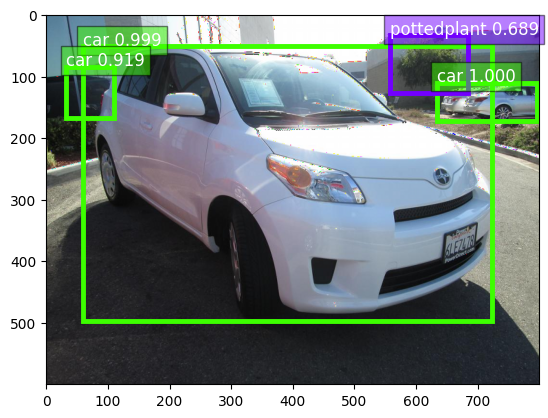

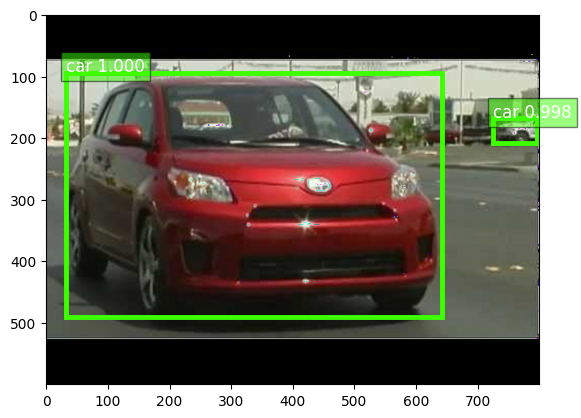

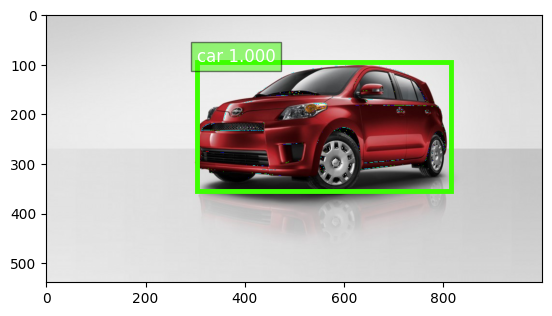

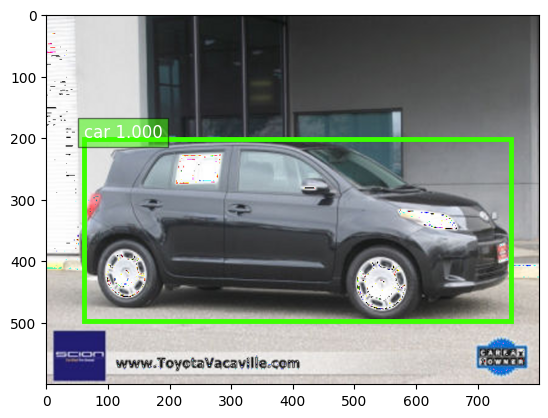

In [ ]:
def detection_testImg():
    for i in range(5):
      image_name = test_df_annot.loc[i, "image_path"]
      image = cv2.imread(image_name)
      rgb_frame = image[:, :, ::-1]
      detect_and_label(rgb_frame)
    cv2.destroyAllWindows()       # handle interrupts

detection_testImg()  

*******************************************

# **MASK RCNN**

In [ ]:
!git clone https://github.com/sambhav37/Mask-R-CNN.git

Cloning into 'Mask-R-CNN'...
remote: Enumerating objects: 13, done.
remote: Total 13 (delta 0), reused 0 (delta 0), pack-reused 13
Unpacking objects: 100% (13/13), 56.78 MiB | 8.98 MiB/s, done.
Updating files: 100% (9/9), done.


In [ ]:
import cv2
mcnn = cv2.dnn.readNetFromTensorflow("/content/drive/MyDrive/Mask-R-CNN/mask-rcnn-coco/frozen_inference_graph.pb",
									"/content/drive/MyDrive/Mask-R-CNN/mask-rcnn-coco/mask_rcnn_inception_v2_coco_2018_01_28.pbtxt")

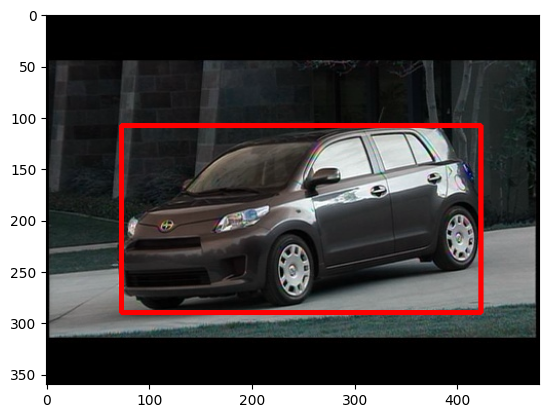

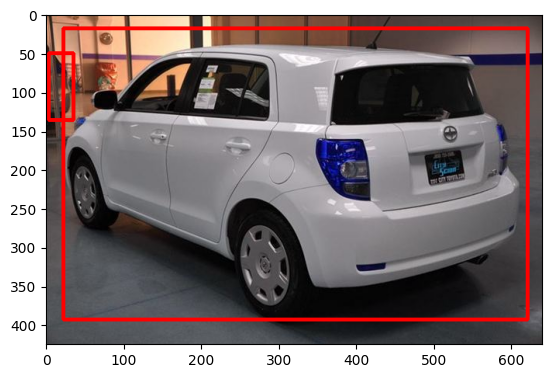

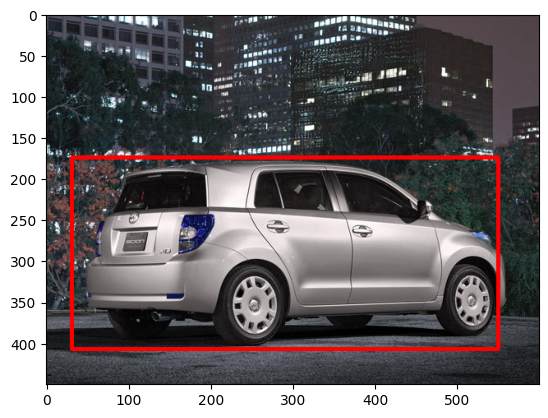

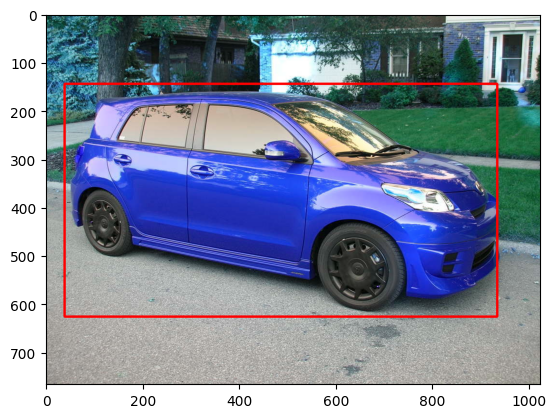

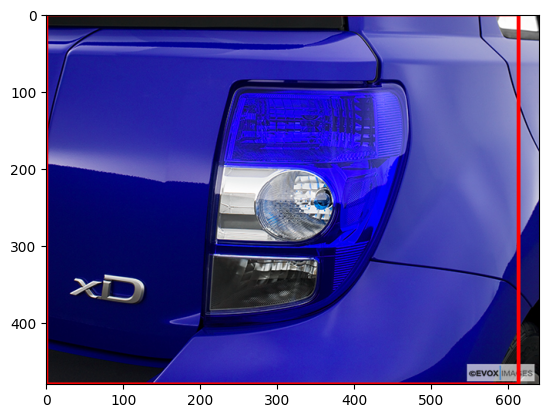

In [ ]:
# images from train folder

colors = np.random.randint(0, 255, (100, 3))

for j in range(5):
  image_name = train_df_annot.loc[j, "image_path"]
  image = cv2.imread(image_name)

  height = image.shape[0]
  width = image.shape[1]

  black_image = np.zeros((height, width, 3), np.uint8)
  black_image[:] = (100, 100, 0)

  detect_objects = cv2.dnn.blobFromImage(image, swapRB=True)
  mcnn.setInput(detect_objects)

  boxes, masks = mcnn.forward(["detection_out_final", "detection_masks"])
  count_detection = boxes.shape[2]

  for i in range(count_detection):
    box_object = boxes[0, 0, i]
    class_id = box_object[1]
    score = box_object[2]
    if score < 0.5:
      continue

    a1 = int(box_object[3] * width)
    b1 = int(box_object[4] * height)
    a2 = int(box_object[5] * width)
    b2 = int(box_object[6] * height)

    roi = black_image[b1: b2, a1: a2]
    roi_height, roi_width, _ = roi.shape

    mask = masks[i, int(class_id)]
    mask = cv2.resize(mask, (roi_width, roi_height))
    _, mask = cv2.threshold(mask, 0.5, 255, cv2.THRESH_BINARY)

    cv2.rectangle(image, (a1, b1), (a2, b2), (255, 0, 0), 3)

    # Get mask coordinates
    contours, _ = cv2.findContours(np.array(mask, np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    color = colors[int(class_id)]
    for cnt in contours:
      cv2.fillPoly(roi, [cnt], (int(color[0]), int(color[1]), int(color[2])))

  plt.imshow(image)
  plt.show()

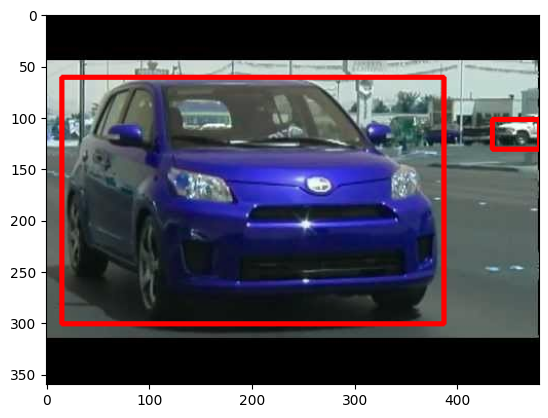

In [ ]:
# Detect objects
i = 2
image_name = test_df_annot.loc[i, "image_path"]
image = cv2.imread(image_name)

height = image.shape[0]
width = image.shape[1]

  # Create black image
black_image = np.zeros((height, width, 3), np.uint8)
black_image[:] = (100, 100, 0)

detect_objects = cv2.dnn.blobFromImage(image, swapRB=True)
mcnn.setInput(detect_objects)

boxes, masks = mcnn.forward(["detection_out_final", "detection_masks"])
count_detection = boxes.shape[2]

for i in range(count_detection):
  box_object = boxes[0, 0, i]
  class_id = box_object[1]
  score = box_object[2]
  if score < 0.5:
    continue

    # Get box Coordinates for each object
  a1 = int(box_object[3] * width)
  b1 = int(box_object[4] * height)
  a2 = int(box_object[5] * width)
  b2 = int(box_object[6] * height)

  roi = black_image[b1: b2, a1: a2]
  roi_height, roi_width, _ = roi.shape

    # Get the mask
  mask = masks[i, int(class_id)]
  mask = cv2.resize(mask, (roi_width, roi_height))
  _, mask = cv2.threshold(mask, 0.5, 255, cv2.THRESH_BINARY)

  cv2.rectangle(image, (a1, b1), (a2, b2), (255, 0, 0), 3)

    # Get mask coordinates
  contours, _ = cv2.findContours(np.array(mask, np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  color = colors[int(class_id)]
  for cnt in contours:
    cv2.fillPoly(roi, [cnt], (int(color[0]), int(color[1]), int(color[2])))

plt.imshow(image)

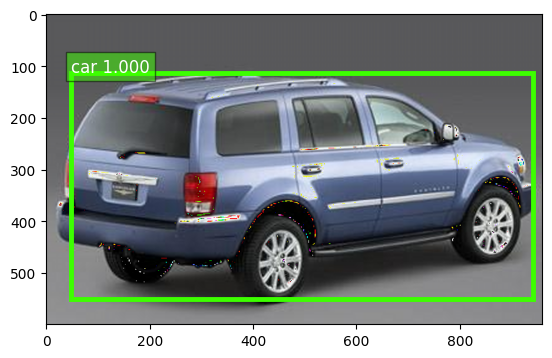

In [ ]:
import mxnet as mx
import gluoncv
from gluoncv import model_zoo, data, utils
from google.colab.patches import cv2_imshow

fcn_net = model_zoo.get_model('faster_rcnn_resnet50_v1b_voc', pretrained=True)         

def detect_and_label(rgb_frame):
    final_array = mx.nd.array(rgb_frame)    
    x, img = gluoncv.data.transforms.presets.rcnn.transform_test(final_array)   
    class_IDs, scores, bounding_boxes = fcn_net(x)          
    ax = utils.viz.plot_bbox(img, bounding_boxes[0], scores[0],
                             class_IDs[0], class_names=fcn_net.classes) 
    plt.show(block=False)         
    plt.pause(0.0001)
    plt.close()      




image_name = test_df_annot.loc[45, "image_path"]
image = cv2.imread(image_name)
rgb_frame = image[:, :, ::-1]
detect_and_label(rgb_frame)